## BUSINESS PROBLEM
- Create a predictive model by applying some data science techniques for the price of cars with the available independent variables. 
- That should help the management to understand how exactly the prices vary with the independent variables.
- They can accordingly manipulate the design of the cars, the business strategy etc. to meet certain price levels


In [243]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
import pickle
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

In [244]:
import warnings 
warnings.filterwarnings('ignore')

In [245]:
data=pd.read_csv("auto_imports.csv")

In [246]:
data.head(6)

,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.60,168.80,64.10,48.80,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
1,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
2,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
3,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
4,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110,5500,19,25,15250
5,1,158,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.40,8.5,110,5500,19,25,17710


In [247]:
print(data.columns)

Index(['3', '?', 'alfa-romero', 'gas', 'std', 'two', 'convertible', 'rwd',
       'front', '88.60', '168.80', '64.10', '48.80', '2548', 'dohc', 'four',
       '130', 'mpfi', '3.47', '2.68', '9.00', '111', '5000', '21', '27',
       '13495'],
      dtype='object')


In [248]:
pd.set_option('display.max_columns', None)

In [249]:
data

,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.60,168.80,64.10,48.80,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
1,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
2,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
3,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
4,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110,5500,19,25,15250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
196,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
197,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
198,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470


In [250]:
data.columns=['symboling','normalized_losses','make','fuel_type','aspiration','num_of_doors','body_style','drive_wheels','engine_location',
              'wheel_base','length','width','height','curb_weight','engine_type','num_of_cylinders','engine_size','fuel_system','bore','stroke','compression_ratio',
             'horsepower','peak_rpm','city_mpg','highway_mpg','price']

In [251]:
data.head()

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
1,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
2,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
3,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
4,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110,5500,19,25,15250


In [252]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          200 non-null    int64  
 1   normalized_losses  200 non-null    object 
 2   make               200 non-null    object 
 3   fuel_type          200 non-null    object 
 4   aspiration         200 non-null    object 
 5   num_of_doors       200 non-null    object 
 6   body_style         200 non-null    object 
 7   drive_wheels       200 non-null    object 
 8   engine_location    200 non-null    object 
 9   wheel_base         200 non-null    float64
 10  length             200 non-null    float64
 11  width              200 non-null    float64
 12  height             200 non-null    float64
 13  curb_weight        200 non-null    int64  
 14  engine_type        200 non-null    object 
 15  num_of_cylinders   200 non-null    object 
 16  engine_size        200 non

In [253]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
symboling,200.0,0.8300,1.248557,-2.0,0.000,1.0,2.000,3.0
wheel_base,200.0,98.8480,6.038261,86.6,94.500,97.0,102.400,120.9
length,200.0,174.2280,12.347132,141.1,166.675,173.2,183.500,208.1
width,200.0,65.8980,2.102904,60.3,64.175,65.5,66.675,72.0
height,200.0,53.7915,2.428449,47.8,52.000,54.1,55.525,59.8
curb_weight,200.0,2555.7050,518.594552,1488.0,2163.000,2414.0,2928.250,4066.0
engine_size,200.0,126.8600,41.650501,61.0,97.750,119.5,142.000,326.0
compression_ratio,200.0,10.1701,4.014163,7.0,8.575,9.0,9.400,23.0
city_mpg,200.0,25.2000,6.432487,13.0,19.000,24.0,30.000,49.0
highway_mpg,200.0,30.7050,6.827227,16.0,25.000,30.0,34.000,54.0


# VISUALIZATION

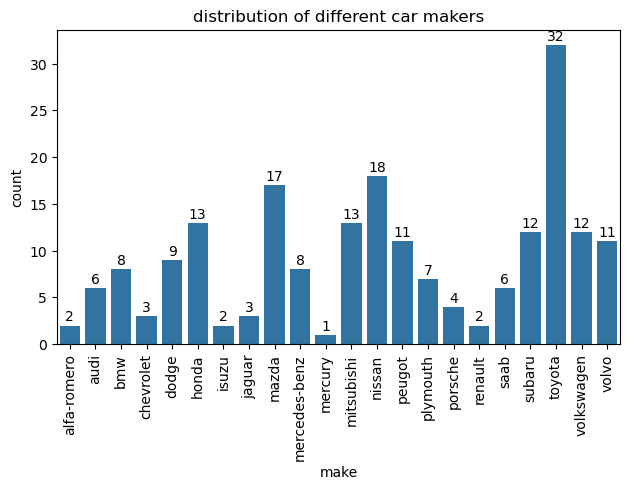

In [254]:
ax=sns.countplot(x="make", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=1)
plt.tight_layout()
plt.title('distribution of different car makers')
plt.show()

#### Insights:"The graph shows that Toyota, Nissan, and Mazda have the highest number of cars, while Alfa-Romeo, Chevrolet, Isuzu, Jaguar, Mercury, and Renault have the least."

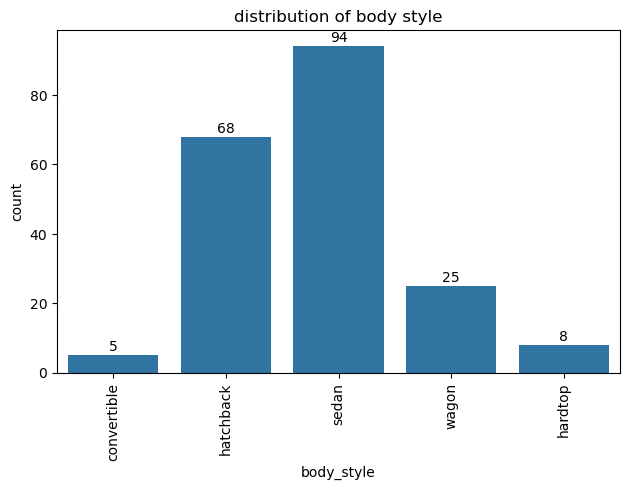

In [255]:
ax=sns.countplot(x="body_style", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=1)
plt.tight_layout()
plt.title('distribution of body style')
plt.show()

#### Insights:"The graph shows that sedan and hatchback are the most common body styles among cars, while convertible and hardtop are the least common."

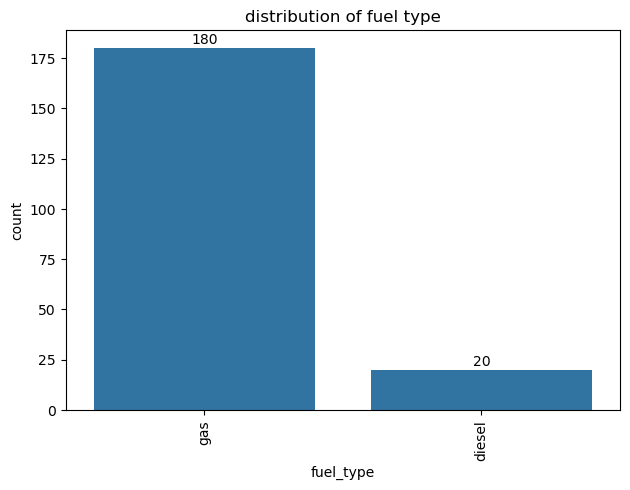

In [256]:

ax=sns.countplot(x="fuel_type", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=1)
plt.tight_layout()
plt.title('distribution of fuel type')
plt.show()

#### Insights:"The majority of cars use Gas as their fuel type."

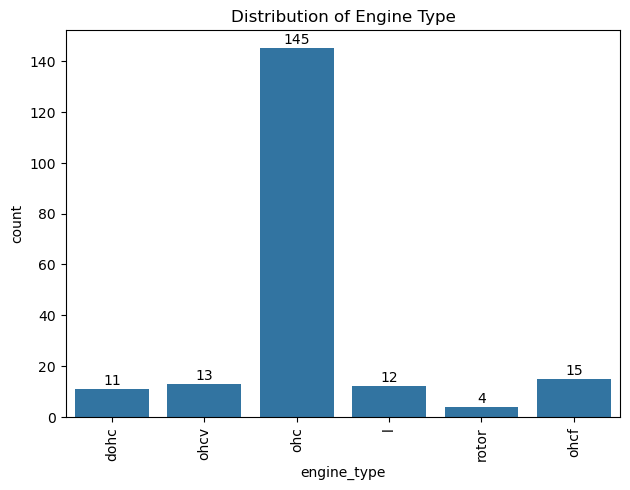

In [257]:


ax=sns.countplot(x="engine_type", data=data)
plt.xticks(rotation=90)# Rotate x-axis labels vertically
ax.bar_label(ax.containers[0], label_type='edge', padding=1)
plt.tight_layout()
plt.title('Distribution of Engine Type')
plt.show()

#### Insights:"As per the graph, the OHC engine type is the most common among cars, while the Rotor engine type is the least common."

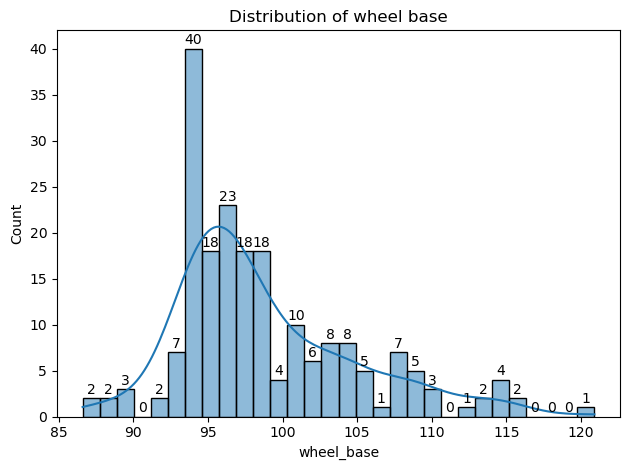

In [258]:
ax=sns.histplot(data=data, x='wheel_base', bins=30, kde=True)
plt.title('Distribution of wheel base')
ax.bar_label(ax.containers[0], label_type='edge', padding=1)
plt.tight_layout()
plt.show()

#### Insights:"The graph shows that a wheelbase between 90 and 100 is the most common among cars."

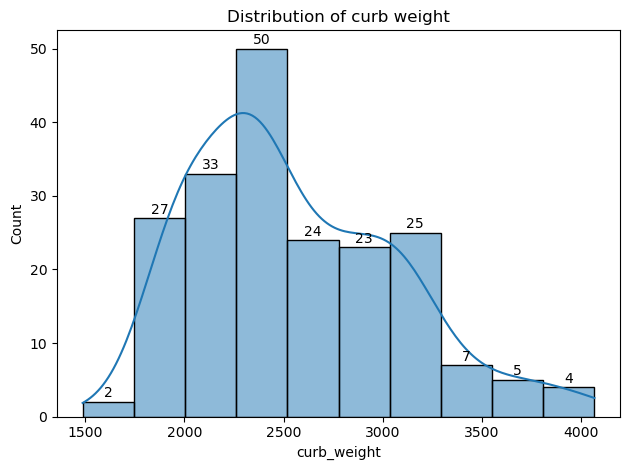

In [259]:
ax= sns.histplot(data=data,x="curb_weight",kde=True)
plt.title('Distribution of curb weight')
ax.bar_label(ax.containers[0],label_type='edge',padding=1)
plt.tight_layout()
plt.show()

#### Insights: "The graph indicates that most cars have a curb weight ranging from 1750 to 3250."

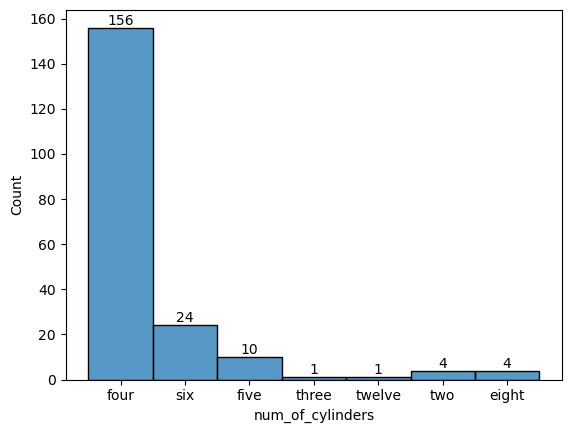

<Figure size 640x480 with 0 Axes>

In [260]:
ax=sns.histplot(data.num_of_cylinders)
ax.bar_label(ax.containers[0])
plt.show()
plt.tight_layout()

#### Insights:"The graph shows that most cars have a four-cylinder engine, making it the most common engine type."

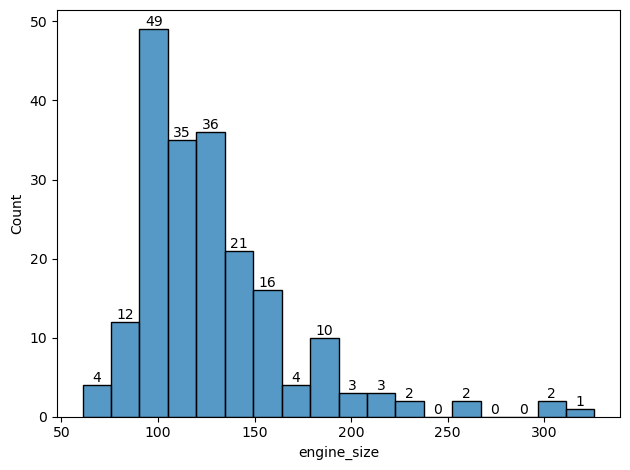

In [261]:
ax=sns.histplot(data.engine_size)
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

#### Insights: "As per the graph, most cars have an engine size ranging from 75 to 160. Larger engine sizes are relatively rare."

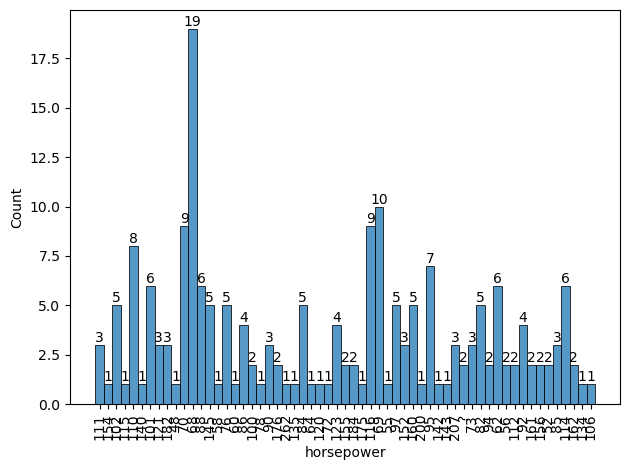

In [262]:
ax=sns.histplot(data.horsepower)
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Insights: "The histogram shows that most cars have horsepower values concentrated between 60 and 120, indicating a preference for moderate engine power. The distribution is right-skewed, with fewer cars having very high horsepower above 160. This suggests high-performance vehicles are less common in the dataset."

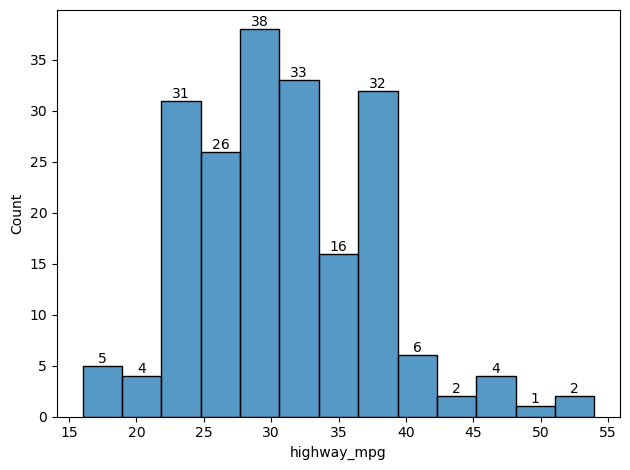

In [263]:
ax=sns.histplot(data.highway_mpg)
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

#### Insights: "The histogram indicates that most cars have a highway mileage between 25 and 40 mpg. The distribution is slightly right-skewed, with fewer cars achieving very high mileage beyond 45 mpg. This suggests that while most vehicles offer decent fuel efficiency, highly fuel-efficient models are relatively rare."

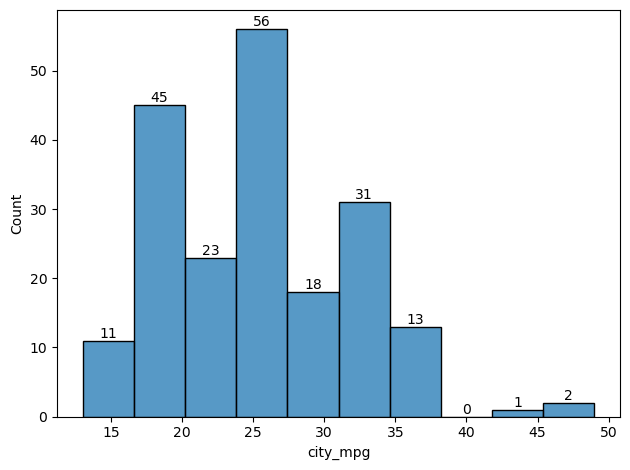

In [264]:
ax=sns.histplot(data.city_mpg)
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

#### insights: "The histogram shows that most cars have city mileage between 20 and 30 mpg. The distribution is slightly right-skewed, indicating that while moderate mileage is common, very high city fuel efficiency is relatively rare."

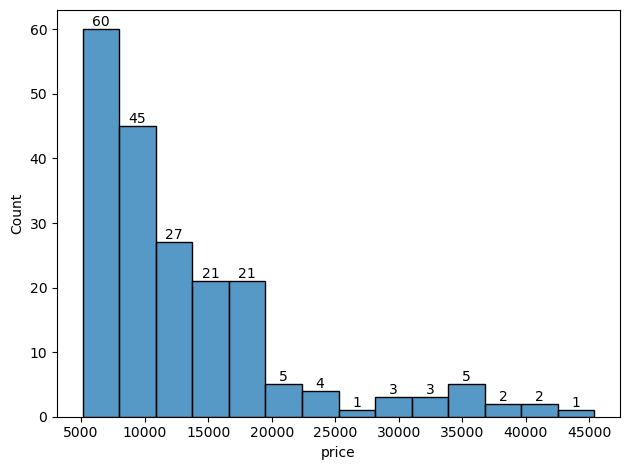

In [265]:
ax=sns.histplot(data.price)
ax.bar_label(ax.containers[0])
plt.tight_layout()
plt.show()

#### Insight: "The histogram shows that most cars are priced between $5,000 and $15,000, indicating that the dataset is dominated by affordable to mid-range vehicles. The distribution is right-skewed, with a few high-end cars priced above $30,000, which appear as outliers."

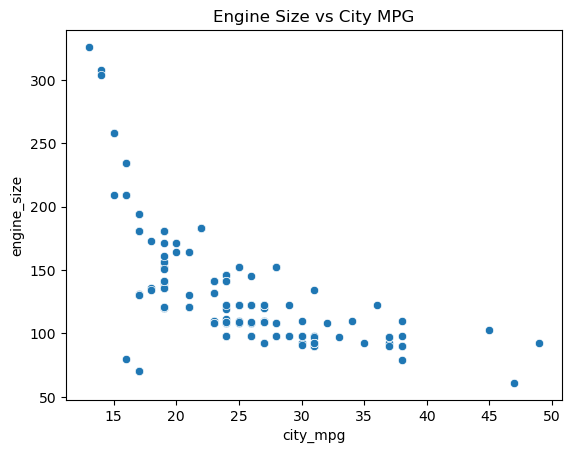

In [266]:
sns.scatterplot( x='city_mpg',y='engine_size', data=data)
plt.title("Engine Size vs City MPG")
plt.show()


#### Insights: "The scatter plot shows a negative relationship between engine size and city MPG. As engine size increases, city fuel efficiency tends to decrease. This suggests that larger engines generally consume more fuel in city driving conditions."

In [267]:
data.groupby('fuel_type')['city_mpg'].mean()


fuel_type
diesel    30.300000
gas       24.633333
Name: city_mpg, dtype: float64

#### Insights: "On average, diesel vehicles have higher city fuel efficiency (30.25 MPG) compared to gas vehicles (24.80 MPG). This suggests that diesel engines are generally more fuel-efficient for city driving in this dataset."

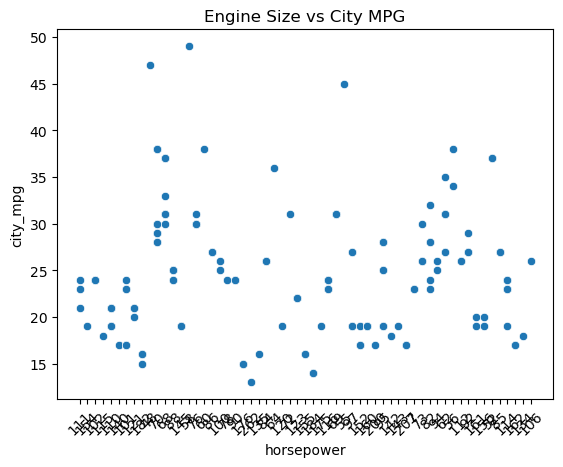

In [268]:
sns.scatterplot( x='horsepower',y='city_mpg', data=data)
plt.xticks(rotation=45)
plt.title("Engine Size vs City MPG")
plt.show()

#### Insight:"The scatter plot shows a clear negative correlation between horsepower and city MPG. As horsepower increases, city fuel efficiency tends to decrease. This suggests that more powerful engines generally consume more fuel in city conditions."

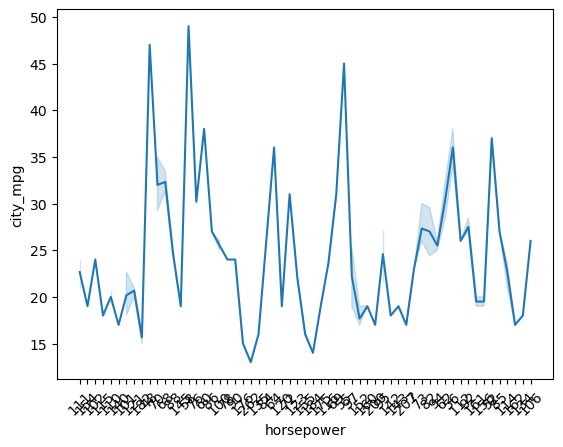

In [269]:
sns.lineplot(x='horsepower',y='city_mpg',data=data)
plt.xticks(rotation=45)
plt.show()


#### Insights: "The line plot shows that average city MPG tends to decrease as horsepower increases. This indicates a negative relationship, suggesting that more powerful engines are generally less fuel-efficient in city conditions."

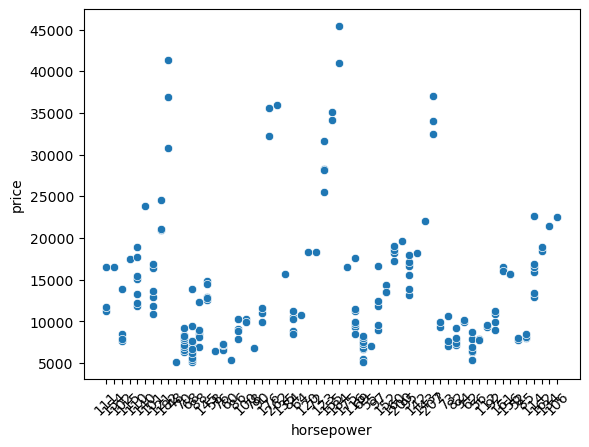

In [270]:
ax=sns.scatterplot(x='horsepower',y='price',data=data)
plt.xticks(rotation=45)
plt.show()

#### Insights: "The scatter plot shows a positive correlation between horsepower and price. As horsepower increases, the price of the vehicle also tends to rise. This suggests that more powerful cars are generally more expensive, likely due to better performance and premium features."

In [271]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
1,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
2,2,164,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
3,2,164,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
4,2,?,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110,5500,19,25,15250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
196,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
197,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
198,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470


In [272]:
data.num_of_cylinders.unique()

array(['four', 'six', 'five', 'three', 'twelve', 'two', 'eight'],
      dtype=object)

In [273]:
word_to_num = {
  
    'two': 2,
    'three': 3,
    'four': 4,
    'five': 5,
    'six': 6,
    'eight': 8,
    'twelve':12
}
data['num_of_cylinders_numeric'] = data['num_of_cylinders'].map(word_to_num)


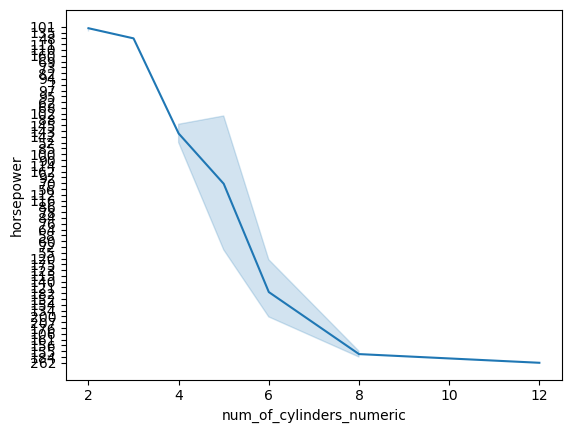

In [274]:
sns.lineplot(x='num_of_cylinders_numeric',y='horsepower',data=data.sort_values('num_of_cylinders_numeric'))

plt.show()

#### Insights: "The line plot shows a strong positive relationship between the number of cylinders and horsepower. As the number of cylinders increases, the average horsepower also increases, indicating that cars with more cylinders tend to have more powerful engines."

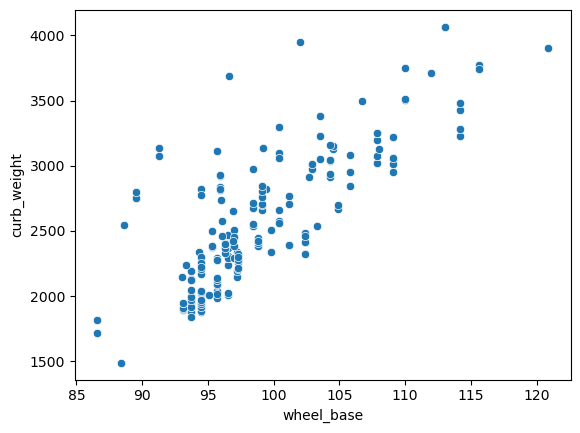

In [275]:
ax=sns.scatterplot(x='wheel_base',y='curb_weight',data=data)


#### Insights: "The scatter plot shows a positive correlation between wheelbase and curb weight. Cars with longer wheelbases tend to weigh more, indicating that larger vehicles are generally heavier, likely due to more structure, space, or added features."

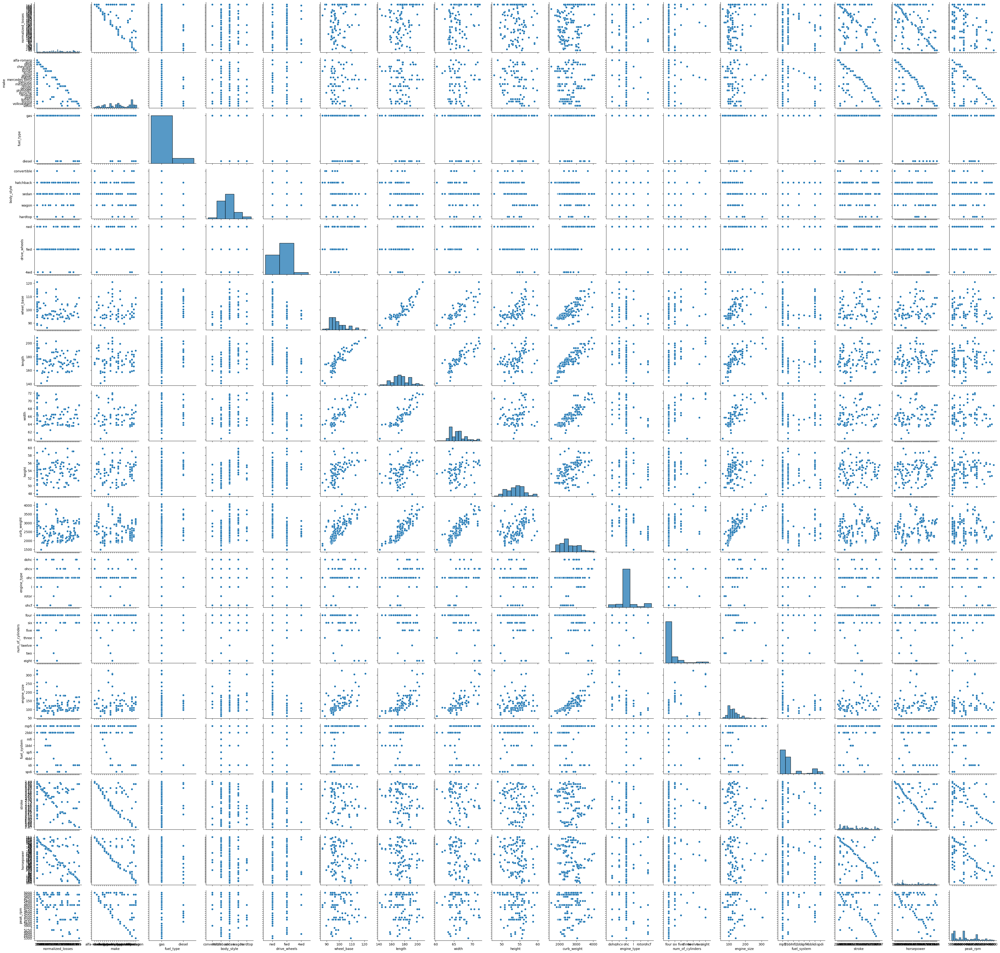

In [276]:
g=sns.pairplot(data, vars=['normalized_losses', 'make','fuel_type','body_style','drive_wheels','wheel_base','length','width',	'height','curb_weight','engine_type','num_of_cylinders'	,'engine_size','fuel_system','stroke','horsepower','peak_rpm'])
g.fig.tight_layout()
g.fig.subplots_adjust(top=0.95) 

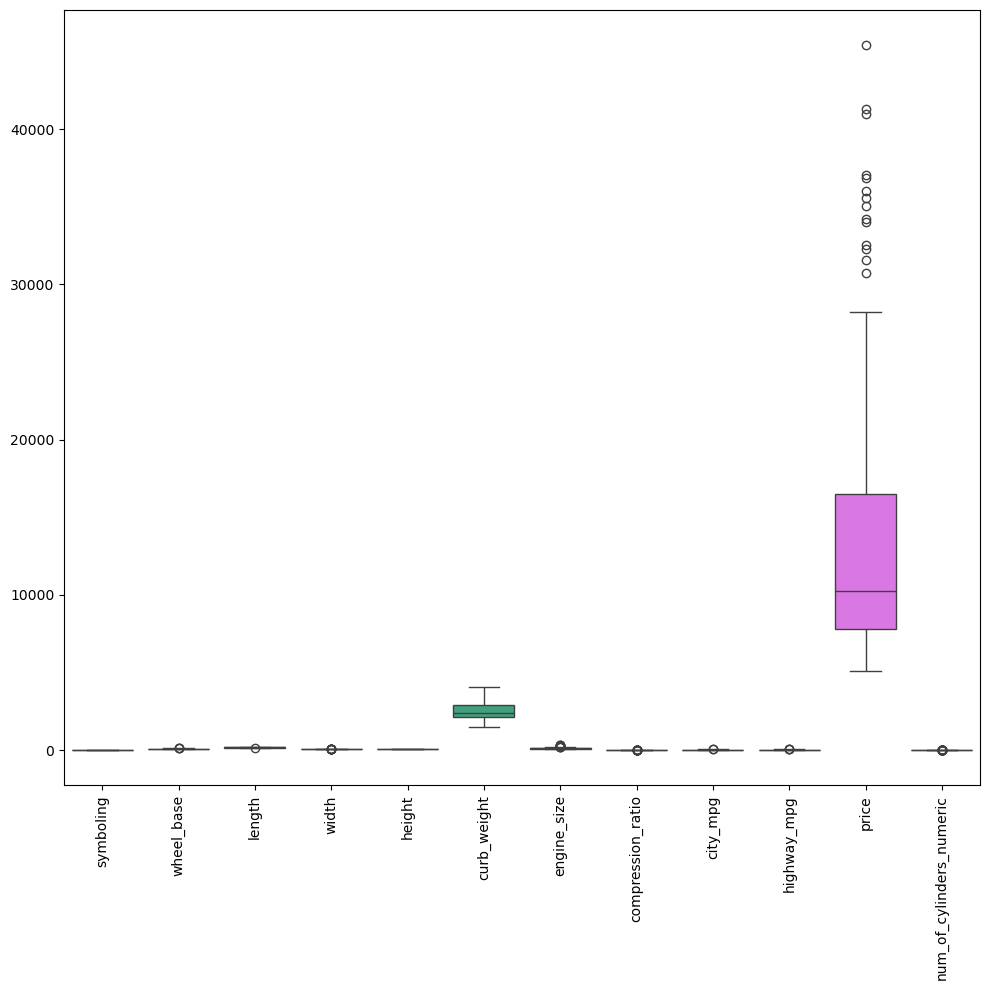

In [277]:
plt.figure(figsize=(10, 10)) 
sns.boxplot(data=data)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# feature engineering

In [278]:
data.isnull().sum()

symboling                   0
normalized_losses           0
make                        0
fuel_type                   0
aspiration                  0
num_of_doors                0
body_style                  0
drive_wheels                0
engine_location             0
wheel_base                  0
length                      0
width                       0
height                      0
curb_weight                 0
engine_type                 0
num_of_cylinders            0
engine_size                 0
fuel_system                 0
bore                        0
stroke                      0
compression_ratio           0
horsepower                  0
peak_rpm                    0
city_mpg                    0
highway_mpg                 0
price                       0
num_of_cylinders_numeric    0
dtype: int64

In [279]:
# there is no null values present in our dataset

In [280]:
data.normalized_losses.unique()

array(['?', '164', '158', '192', '188', '121', '98', '81', '118', '148',
       '110', '145', '137', '101', '78', '106', '85', '107', '104', '113',
       '150', '129', '115', '93', '142', '161', '153', '125', '128',
       '122', '103', '168', '108', '194', '231', '119', '154', '74',
       '186', '83', '102', '89', '87', '77', '91', '134', '65', '197',
       '90', '94', '256', '95'], dtype=object)

In [281]:
data['normalized_losses'] = pd.to_numeric(data['normalized_losses'], errors='coerce')

In [282]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   symboling                 200 non-null    int64  
 1   normalized_losses         164 non-null    float64
 2   make                      200 non-null    object 
 3   fuel_type                 200 non-null    object 
 4   aspiration                200 non-null    object 
 5   num_of_doors              200 non-null    object 
 6   body_style                200 non-null    object 
 7   drive_wheels              200 non-null    object 
 8   engine_location           200 non-null    object 
 9   wheel_base                200 non-null    float64
 10  length                    200 non-null    float64
 11  width                     200 non-null    float64
 12  height                    200 non-null    float64
 13  curb_weight               200 non-null    int64  
 14  engine_typ

In [283]:
# for normalized_losses column : we have to chnage ' ? '

In [284]:
data['normalized_losses'] = data['normalized_losses'].fillna(data['normalized_losses'].median())

In [285]:
data['normalized_losses'].unique()

array([115., 164., 158., 192., 188., 121.,  98.,  81., 118., 148., 110.,
       145., 137., 101.,  78., 106.,  85., 107., 104., 113., 150., 129.,
        93., 142., 161., 153., 125., 128., 122., 103., 168., 108., 194.,
       231., 119., 154.,  74., 186.,  83., 102.,  89.,  87.,  77.,  91.,
       134.,  65., 197.,  90.,  94., 256.,  95.])

In [286]:
# for num_doors column we have to replace '?' with mode value 

In [287]:
data.num_of_doors.unique()

array(['two', 'four', '?'], dtype=object)

In [288]:
data['num_of_doors']=data['num_of_doors'].replace('?','four')

In [289]:
data.num_of_doors.value_counts()

num_of_doors
four    115
two      85
Name: count, dtype: int64

In [290]:
# for bore column we have to replace  ? with 4.00

In [291]:
data.bore.unique()

array(['3.47', '2.68', '3.19', '3.13', '3.50', '3.31', '3.62', '2.91',
       '3.03', '2.97', '3.34', '3.60', '2.92', '3.15', '3.43', '3.63',
       '3.54', '3.08', '?', '3.39', '3.76', '3.58', '3.46', '3.80',
       '3.78', '3.17', '3.35', '3.59', '2.99', '3.33', '3.70', '3.61',
       '3.94', '3.74', '2.54', '3.05', '3.27', '3.24', '3.01'],
      dtype=object)

In [292]:
# first we have to convert type of data.bore which is object

In [293]:
data['bore'] = pd.to_numeric(data['bore'], errors='coerce')

In [294]:
data['bore'] = data['bore'].fillna(data['bore'].median())

In [295]:
data.bore.unique()

array([3.47, 2.68, 3.19, 3.13, 3.5 , 3.31, 3.62, 2.91, 3.03, 2.97, 3.34,
       3.6 , 2.92, 3.15, 3.43, 3.63, 3.54, 3.08, 3.39, 3.76, 3.58, 3.46,
       3.8 , 3.78, 3.17, 3.35, 3.59, 2.99, 3.33, 3.7 , 3.61, 3.94, 3.74,
       2.54, 3.05, 3.27, 3.24, 3.01])

In [296]:
# for stroke column we have to replace it with median

In [297]:
data['stroke'] = pd.to_numeric(data['stroke'], errors='coerce')

In [298]:
data['stroke'].unique()

array([2.68, 3.47, 3.4 , 2.8 , 3.19, 3.39, 3.03, 3.11, 3.23, 3.46, 3.9 ,
       3.41, 3.07, 3.58, 4.17, 2.76, 3.15,  nan, 3.16, 3.64, 3.1 , 3.35,
       3.12, 3.86, 3.29, 3.27, 3.52, 2.19, 3.21, 2.9 , 2.07, 2.36, 2.64,
       3.08, 3.5 , 3.54, 2.87])

In [299]:
data['stroke'] = data['stroke'].fillna(data['stroke'].median())

In [300]:
data.stroke.unique()

array([2.68, 3.47, 3.4 , 2.8 , 3.19, 3.39, 3.03, 3.11, 3.23, 3.46, 3.9 ,
       3.41, 3.07, 3.58, 4.17, 2.76, 3.15, 3.29, 3.16, 3.64, 3.1 , 3.35,
       3.12, 3.86, 3.27, 3.52, 2.19, 3.21, 2.9 , 2.07, 2.36, 2.64, 3.08,
       3.5 , 3.54, 2.87])

In [301]:
# for horsepower column we have to replace it with median

In [302]:
data['horsepower']=pd.to_numeric(data['horsepower'],errors='coerce')

In [303]:
data.horsepower.unique()

array([111., 154., 102., 115., 110., 140., 101., 121., 182.,  48.,  70.,
        68.,  88., 145.,  58.,  76.,  60.,  86., 100.,  78.,  90., 176.,
       262., 135.,  84.,  64., 120.,  72., 123., 155., 184., 175., 116.,
        69.,  55.,  97., 152., 160., 200.,  95., 142., 143., 207.,  nan,
        73.,  82.,  94.,  62.,  56., 112.,  92., 161., 156.,  52.,  85.,
       114., 162., 134., 106.])

In [304]:
data['horsepower']=data['horsepower'].fillna(data['horsepower'].median())

In [305]:
data.horsepower.unique()

array([111., 154., 102., 115., 110., 140., 101., 121., 182.,  48.,  70.,
        68.,  88., 145.,  58.,  76.,  60.,  86., 100.,  78.,  90., 176.,
       262., 135.,  84.,  64., 120.,  72., 123., 155., 184., 175., 116.,
        69.,  55.,  97., 152., 160., 200.,  95., 142., 143., 207.,  73.,
        82.,  94.,  62.,  56., 112.,  92., 161., 156.,  52.,  85., 114.,
       162., 134., 106.])

In [306]:
# for peak_rpm column we have to replace it with median

In [307]:
data['peak_rpm']=pd.to_numeric(data['peak_rpm'],errors='coerce')

In [308]:
data.peak_rpm.unique()

array([5000., 5500., 5800., 4250., 5400., 5100., 4800., 6000., 4750.,
       4650., 4200., 4350., 4500., 5200., 4150., 5600., 5900.,   nan,
       5250., 4900., 4400., 6600., 5300.])

In [309]:
data['peak_rpm']=data['peak_rpm'].fillna(data['peak_rpm'].median())

In [310]:
data.peak_rpm.unique()

array([5000., 5500., 5800., 4250., 5400., 5100., 4800., 6000., 4750.,
       4650., 4200., 4350., 4500., 5200., 4150., 5600., 5900., 5250.,
       4900., 4400., 6600., 5300.])

In [311]:
# for price column

In [312]:
data['price'].isnull().sum()

0

In [313]:
data['price'].unique()

array([16500, 13950, 17450, 15250, 17710, 18920, 23875, 16430, 16925,
       20970, 21105, 24565, 30760, 41315, 36880,  5151,  6295,  6575,
        5572,  6377,  7957,  6229,  6692,  7609,  8558,  8921, 12964,
        6479,  6855,  5399,  6529,  7129,  7295,  7895,  9095,  8845,
       10295, 12945, 10345,  6785, 11048, 32250, 35550, 36000,  5195,
        6095,  6795,  6695,  7395, 10945, 11845, 13645, 15645,  8495,
       10595, 10245, 10795, 11245, 18280, 18344, 25552, 28248, 28176,
       31600, 34184, 35056, 40960, 45400, 16503,  5389,  6189,  6669,
        7689,  9959,  8499, 12629, 14869, 14489,  6989,  8189,  9279,
        5499,  7099,  6649,  6849,  7349,  7299,  7799,  7499,  7999,
        8249,  8949,  9549, 13499, 14399, 17199, 19699, 18399, 11900,
       13200, 12440, 13860, 15580, 16900, 16695, 17075, 16630, 17950,
       18150, 12764, 22018, 32528, 34028, 37028,  9295,  9895, 11850,
       12170, 15040, 15510, 18620,  5118,  7053,  7603,  7126,  7775,
        9960,  9233,

In [314]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price,num_of_cylinders_numeric
0,3,115.0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500,4
1,1,115.0,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500,6
2,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950,4
3,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450,5
4,2,115.0,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,15250,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845,4
196,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045,4
197,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485,6
198,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470,6


### BOX PLOT FOR OUTLIER DETECTION

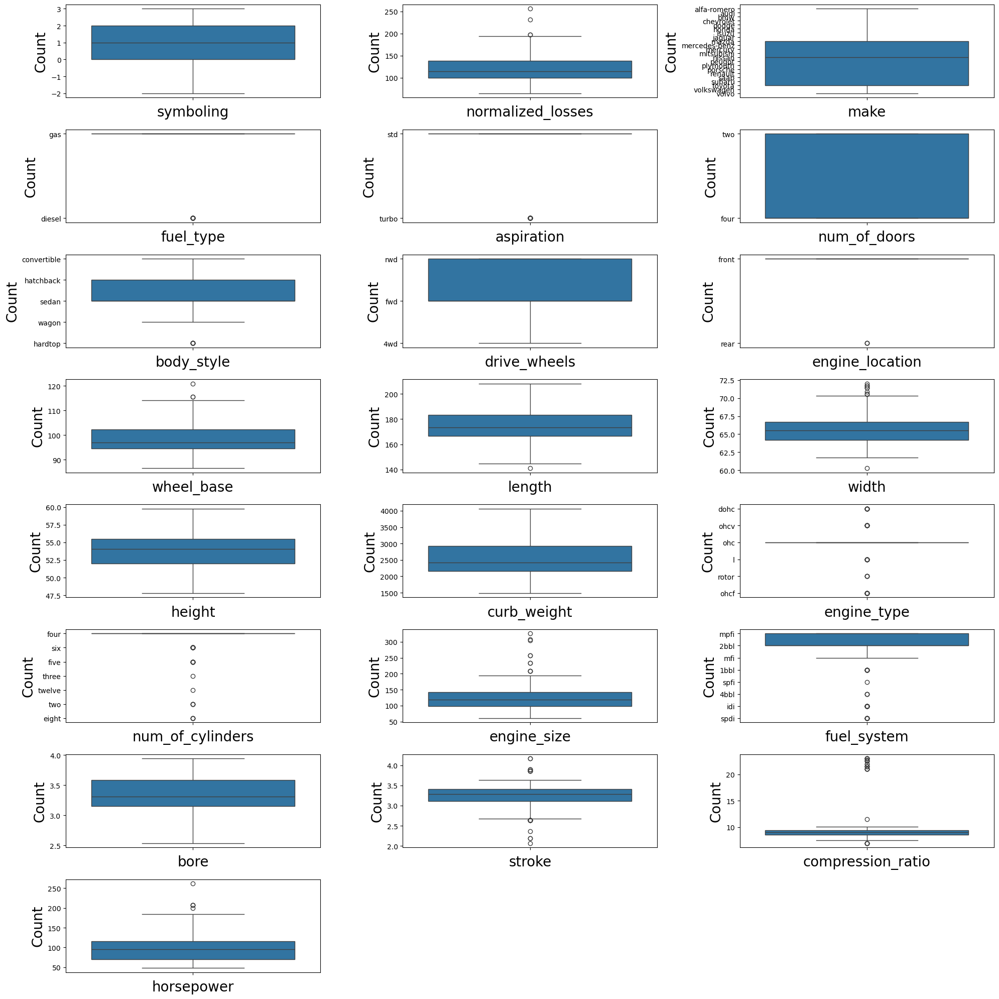

In [315]:
#Checking the outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in data:
    if plotnumber<=22:
        ax=plt.subplot(8,3,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [316]:
data1=data.copy()

In [317]:
data1

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price,num_of_cylinders_numeric
0,3,115.0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500,4
1,1,115.0,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500,6
2,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950,4
3,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450,5
4,2,115.0,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,15250,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845,4
196,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045,4
197,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485,6
198,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470,6


In [318]:
data1.drop('price',axis=1,inplace=True)

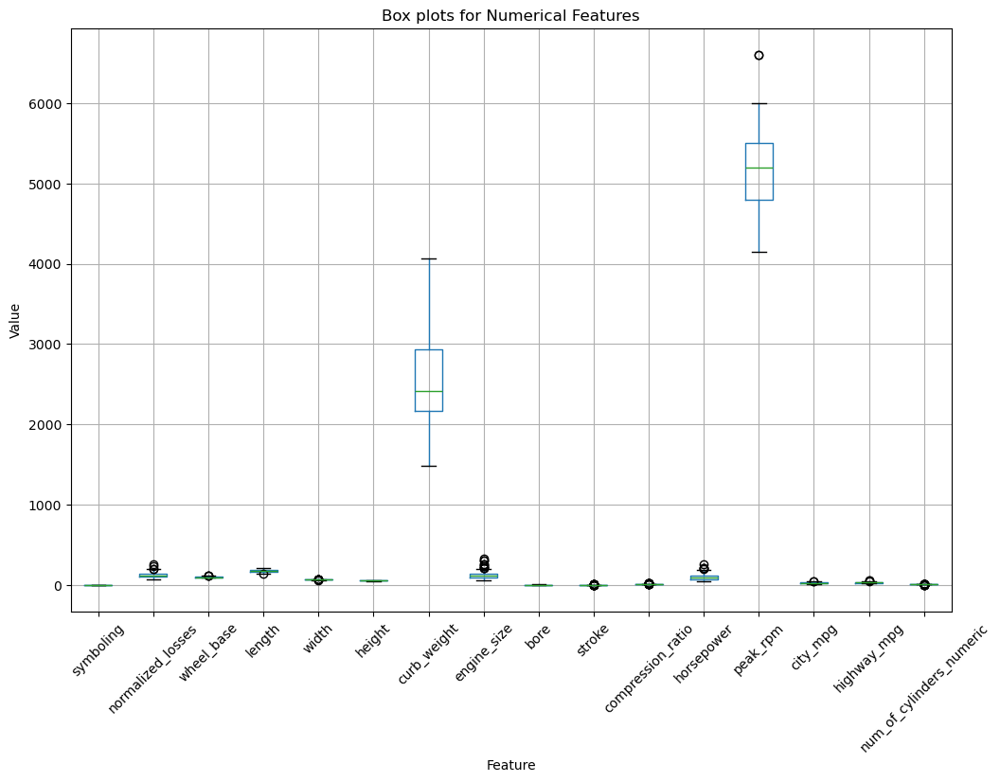

In [319]:
# Select numerical columns
numerical_cols = data1.select_dtypes(include=['int', 'float']).columns

# Create box plots for all numerical features
plt.figure(figsize=(12, 8))
data1[numerical_cols].boxplot()
plt.xticks(rotation=45)
plt.title('Box plots for Numerical Features')
plt.ylabel('Value')
plt.xlabel('Feature')
plt.show()

In [320]:
data1

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,num_of_cylinders_numeric
0,3,115.0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,4
1,1,115.0,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,6
2,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,4
3,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,5
4,2,115.0,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,4
196,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,4
197,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,6
198,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,6


# EDA

In [321]:
pip install ydata-profiling


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [322]:
from ydata_profiling import ProfileReport


In [323]:
profile=ProfileReport(data,title="EDA",explorative=False)

In [324]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 40.00it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# CORRELATION MATRICS

<Axes: >

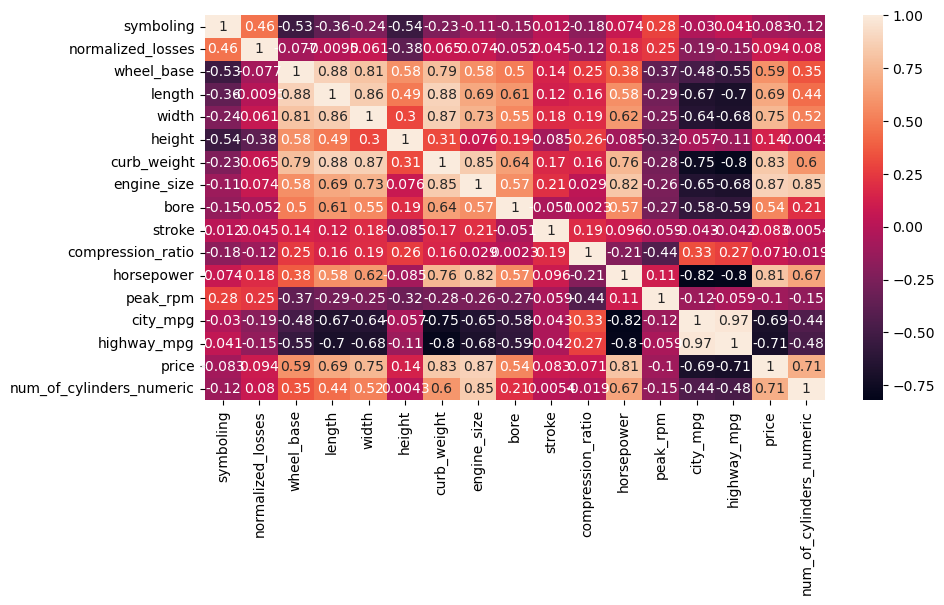

In [325]:
plt.figure(figsize=(10, 5))
sns.heatmap(data.select_dtypes(include=['int','float']).corr(),annot=True)


#### Insights: There are no strong correlation between any column.

<Axes: >

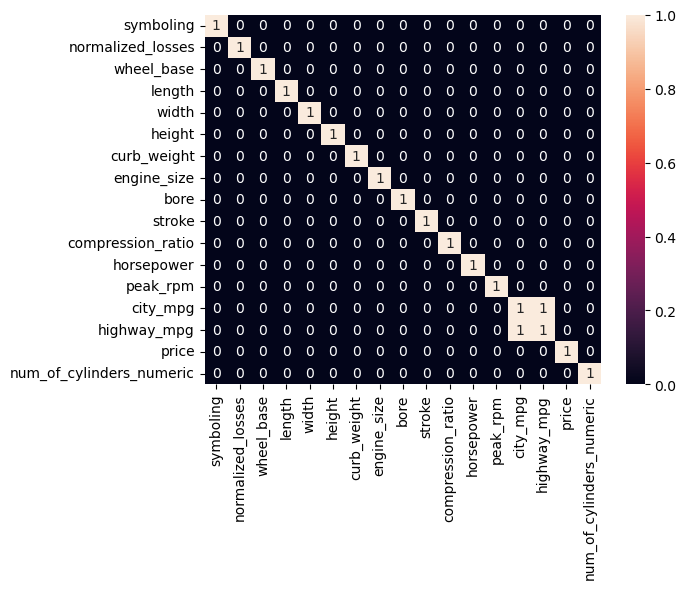

In [326]:
sns.heatmap(data.select_dtypes(include=['int','float']).corr()>0.9,annot=True)

# PRE PROCESSSING

In [327]:
data_new=data.select_dtypes(exclude=['int','float'])

In [328]:
data_new.columns

Index(['make', 'fuel_type', 'aspiration', 'num_of_doors', 'body_style',
       'drive_wheels', 'engine_location', 'engine_type', 'num_of_cylinders',
       'fuel_system'],
      dtype='object')

In [329]:
len(data_new.columns)

10

In [330]:
data_new 

,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,engine_type,num_of_cylinders,fuel_system
0,alfa-romero,gas,std,two,convertible,rwd,front,dohc,four,mpfi
1,alfa-romero,gas,std,two,hatchback,rwd,front,ohcv,six,mpfi
2,audi,gas,std,four,sedan,fwd,front,ohc,four,mpfi
3,audi,gas,std,four,sedan,4wd,front,ohc,five,mpfi
4,audi,gas,std,two,sedan,fwd,front,ohc,five,mpfi
...,...,...,...,...,...,...,...,...,...,...
195,volvo,gas,std,four,sedan,rwd,front,ohc,four,mpfi
196,volvo,gas,turbo,four,sedan,rwd,front,ohc,four,mpfi
197,volvo,gas,std,four,sedan,rwd,front,ohcv,six,mpfi
198,volvo,diesel,turbo,four,sedan,rwd,front,ohc,six,idi


### make

In [331]:
data_new.make.value_counts()

make
toyota           32
nissan           18
mazda            17
mitsubishi       13
honda            13
volkswagen       12
subaru           12
peugot           11
volvo            11
dodge             9
mercedes-benz     8
bmw               8
plymouth          7
audi              6
saab              6
porsche           4
jaguar            3
chevrolet         3
isuzu             2
renault           2
alfa-romero       2
mercury           1
Name: count, dtype: int64

* make is not as much important for us so we skip this.

### fuel_type

In [332]:
data_new.fuel_type.value_counts()

fuel_type
gas       180
diesel     20
Name: count, dtype: int64

* we will apply one hot encoidng on fuel_type

### aspiration

In [333]:
data_new.aspiration.value_counts()

aspiration
std      164
turbo     36
Name: count, dtype: int64

* we will apply one hot encoding on this column

### num_of_doors

In [334]:
data_new.num_of_doors.value_counts()

num_of_doors
four    115
two      85
Name: count, dtype: int64

* this column is not as much important so we skip apllying encoding om this column

### body_style

In [335]:
data_new.body_style.value_counts()

body_style
sedan          94
hatchback      68
wagon          25
hardtop         8
convertible     5
Name: count, dtype: int64

* we will apply one hot encoding on this column 

### drive_wheels

In [336]:
data_new.drive_wheels.value_counts()

drive_wheels
fwd    118
rwd     74
4wd      8
Name: count, dtype: int64

* we will apply one hot encoding on this column

### engine_location

In [337]:
data_new.engine_location.value_counts()

engine_location
front    197
rear       3
Name: count, dtype: int64

* we will aplly one hot encoding on this column

### engine_type

In [338]:
data_new.engine_type.value_counts()

engine_type
ohc      145
ohcf      15
ohcv      13
l         12
dohc      11
rotor      4
Name: count, dtype: int64

* we will apply one hot encoding one this column

### num_of_cylinders

In [339]:
data_new.num_of_cylinders.value_counts()

num_of_cylinders
four      156
six        24
five       10
two         4
eight       4
three       1
twelve      1
Name: count, dtype: int64

### fuel_system

In [340]:
data_new.fuel_system.value_counts()

fuel_system
mpfi    91
2bbl    64
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: count, dtype: int64

In [341]:
num_data=data.select_dtypes(include=['int','float'])

In [342]:
num_data.drop('price',axis=1,inplace=True)

In [343]:
num_data.columns

Index(['symboling', 'normalized_losses', 'wheel_base', 'length', 'width',
       'height', 'curb_weight', 'engine_size', 'bore', 'stroke',
       'compression_ratio', 'horsepower', 'peak_rpm', 'city_mpg',
       'highway_mpg', 'num_of_cylinders_numeric'],
      dtype='object')

In [344]:
data.drop('make',axis=1,inplace=True)

In [345]:
data.num_of_doors.value_counts()

num_of_doors
four    115
two      85
Name: count, dtype: int64

#### insights: we have to change below two categorical column into numerical because we have to give it to pipeline.

In [346]:
door_mapping = {
    "two": 2,
    "four": 4
}

data["num_of_doors"] = data["num_of_doors"].map(door_mapping)


In [347]:
data

,symboling,normalized_losses,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price,num_of_cylinders_numeric
0,3,115.0,gas,std,2,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500,4
1,1,115.0,gas,std,2,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500,6
2,2,164.0,gas,std,4,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950,4
3,2,164.0,gas,std,4,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450,5
4,2,115.0,gas,std,2,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,15250,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95.0,gas,std,4,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845,4
196,-1,95.0,gas,turbo,4,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045,4
197,-1,95.0,gas,std,4,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485,6
198,-1,95.0,diesel,turbo,4,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470,6


In [348]:
data.num_of_cylinders.value_counts()

num_of_cylinders
four      156
six        24
five       10
two         4
eight       4
three       1
twelve      1
Name: count, dtype: int64

In [349]:
cylinder_mapping = {
    "two": 2,
    "three": 3,
    "four": 4,
    "five": 5,
    "six": 6,
    "eight": 8,
    "twelve": 12
}

data["num_of_cylinders"] = data["num_of_cylinders"].map(cylinder_mapping)


#### 
1) from feature engineering data, we have to use two types of encoder
* one hot encoder
* ordinal encoder

   for not usefull columns we will pass the data as same
 
2)we have to apply standard scaler on the numerical column because the values are continuous

In [350]:
ohe_columns=['fuel_type','aspiration','body_style','drive_wheels','engine_location','engine_type']
ordinal_encoder=['fuel_system']
standard_scaler=['symboling', 'normalized_losses', 'wheel_base', 'length', 'width',
       'height', 'curb_weight', 'engine_size', 'bore', 'stroke',
       'compression_ratio', 'horsepower', 'peak_rpm', 'city_mpg',
       'highway_mpg', 'num_of_cylinders_numeric']
passthrough=['num_of_doors','num_of_cylinders']

In [351]:
def same(x):
    return x
    

In [352]:
no_trans=FunctionTransformer(same)

In [353]:
preprocessor=ColumnTransformer([
('OHE COLUMNS',OneHotEncoder(handle_unknown='ignore'),ohe_columns),
('ORDINAL ENCODER',OrdinalEncoder(),ordinal_encoder),
('STANDRAD SCALER',StandardScaler(),standard_scaler),
('PASS THROUGH','passthrough',passthrough)])

In [354]:
preprocessor

ColumnTransformer(transformers=[('OHE COLUMNS',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['fuel_type', 'aspiration', 'body_style',
                                  'drive_wheels', 'engine_location',
                                  'engine_type']),
                                ('ORDINAL ENCODER', OrdinalEncoder(),
                                 ['fuel_system']),
                                ('STANDRAD SCALER', StandardScaler(),
                                 ['symboling', 'normalized_losses',
                                  'wheel_base', 'length', 'width', 'height',
                                  'curb_weight', 'engine_size', 'bore',
                                  'stroke', 'compression_ratio', 'horsepower',
                                  'peak_rpm', 'city_mpg', 'highway_mpg',
                                  'num_of_cylinders_numeric']),
                                ('PASS THROUGH', 'passthrough',
                                 ['num_of_doors', 'num_of_cylinders'])])

In [355]:
file=open('AUTOPRICE.pkl','wb')

In [356]:
pickle.dump(preprocessor,file)

In [357]:
data

,symboling,normalized_losses,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price,num_of_cylinders_numeric
0,3,115.0,gas,std,2,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,4,130,mpfi,3.47,2.68,9.0,111.0,5000.0,21,27,16500,4
1,1,115.0,gas,std,2,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,6,152,mpfi,2.68,3.47,9.0,154.0,5000.0,19,26,16500,6
2,2,164.0,gas,std,4,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,4,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950,4
3,2,164.0,gas,std,4,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,5,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450,5
4,2,115.0,gas,std,2,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,5,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,15250,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,-1,95.0,gas,std,4,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,4,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845,4
196,-1,95.0,gas,turbo,4,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,4,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045,4
197,-1,95.0,gas,std,4,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,6,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485,6
198,-1,95.0,diesel,turbo,4,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,6,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470,6


# SPLITING DATA 

In [358]:
X = data.drop(["price"], axis=1)
y = data["price"]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [359]:
X_train

,symboling,normalized_losses,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,length,width,height,curb_weight,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,num_of_cylinders_numeric
169,-1,65.0,diesel,turbo,4,sedan,fwd,front,102.4,175.6,66.5,54.9,2480,ohc,4,110,idi,3.27,3.35,22.5,73.0,4500.0,30,33,4
97,0,128.0,gas,std,4,sedan,fwd,front,100.4,181.7,66.5,55.1,3095,ohcv,6,181,mpfi,3.43,3.27,9.0,152.0,5200.0,17,22,6
31,1,101.0,gas,std,2,hatchback,fwd,front,93.7,150.0,64.0,52.6,1940,ohc,4,92,1bbl,2.91,3.41,9.2,76.0,6000.0,30,34,4
12,1,115.0,gas,std,4,sedan,rwd,front,103.5,189.0,66.9,55.7,3055,ohc,6,164,mpfi,3.31,3.19,9.0,121.0,4250.0,20,25,6
35,0,106.0,gas,std,2,hatchback,fwd,front,96.5,167.5,65.2,53.3,2236,ohc,4,110,1bbl,3.15,3.58,9.0,86.0,5800.0,27,33,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0,115.0,diesel,turbo,4,wagon,rwd,front,114.2,198.9,68.4,58.7,3430,l,4,152,idi,3.70,3.52,21.0,95.0,4150.0,25,25,4
14,0,115.0,gas,std,2,sedan,rwd,front,103.5,193.8,67.9,53.7,3380,ohc,6,209,mpfi,3.62,3.39,8.0,182.0,5400.0,16,22,6
92,1,122.0,gas,std,4,sedan,fwd,front,94.5,165.3,63.8,54.5,1971,ohc,4,97,2bbl,3.15,3.29,9.4,69.0,5200.0,31,37,4
179,2,94.0,diesel,std,4,sedan,fwd,front,97.3,171.7,65.5,55.7,2264,ohc,4,97,idi,3.01,3.40,23.0,52.0,4800.0,37,46,4


In [360]:
# Load a preprocessor object from a pickled file
with open('AUTOPRICE.pkl',"rb") as f:
    preprocessor=pickle.load(f)

In [361]:
X_train_processed = preprocessor.fit_transform(X_train)


In [362]:
X_train_processed

array([[ 1.        ,  0.        ,  0.        , ..., -0.30933498,
         4.        ,  4.        ],
       [ 0.        ,  1.        ,  1.        , ...,  2.09660373,
         4.        ,  6.        ],
       [ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         2.        ,  4.        ],
       ...,
       [ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         4.        ,  4.        ],
       [ 1.        ,  0.        ,  1.        , ..., -0.30933498,
         4.        ,  4.        ],
       [ 0.        ,  1.        ,  1.        , ...,  2.09660373,
         2.        ,  6.        ]])

In [363]:
preprocessor

ColumnTransformer(transformers=[('OHE COLUMNS',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['fuel_type', 'aspiration', 'body_style',
                                  'drive_wheels', 'engine_location',
                                  'engine_type']),
                                ('ORDINAL ENCODER', OrdinalEncoder(),
                                 ['fuel_system']),
                                ('STANDRAD SCALER', StandardScaler(),
                                 ['symboling', 'normalized_losses',
                                  'wheel_base', 'length', 'width', 'height',
                                  'curb_weight', 'engine_size', 'bore',
                                  'stroke', 'compression_ratio', 'horsepower',
                                  'peak_rpm', 'city_mpg', 'highway_mpg',
                                  'num_of_cylinders_numeric']),
                                ('PASS THROUGH', 'passthrough',
                                 ['num_of_doors', 'num_of_cylinders'])])

In [364]:
X_test_processed = preprocessor.transform(X_test)

In [365]:
X_test_processed

array([[ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         4.        ,  4.        ],
       [ 0.        ,  1.        ,  1.        , ...,  2.09660373,
         4.        ,  6.        ],
       [ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         2.        ,  4.        ],
       ...,
       [ 0.        ,  1.        ,  1.        , ...,  2.09660373,
         4.        ,  6.        ],
       [ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         4.        ,  4.        ],
       [ 0.        ,  1.        ,  1.        , ..., -0.30933498,
         4.        ,  4.        ]])

In [366]:
preprocessor

ColumnTransformer(transformers=[('OHE COLUMNS',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['fuel_type', 'aspiration', 'body_style',
                                  'drive_wheels', 'engine_location',
                                  'engine_type']),
                                ('ORDINAL ENCODER', OrdinalEncoder(),
                                 ['fuel_system']),
                                ('STANDRAD SCALER', StandardScaler(),
                                 ['symboling', 'normalized_losses',
                                  'wheel_base', 'length', 'width', 'height',
                                  'curb_weight', 'engine_size', 'bore',
                                  'stroke', 'compression_ratio', 'horsepower',
                                  'peak_rpm', 'city_mpg', 'highway_mpg',
                                  'num_of_cylinders_numeric']),
                                ('PASS THROUGH', 'passthrough',
                                 ['num_of_doors', 'num_of_cylinders'])])

# MODEL BUILDING

In [367]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# Define model grid
models_params = {
    "LinearRegression": (LinearRegression(), {}),

    "DecisionTree": (DecisionTreeRegressor(random_state=42), {
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 2]
    }),

    "RandomForest": (RandomForestRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "max_depth": [None, 10],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 2]
    }),

    "GradientBoosting": (GradientBoostingRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "learning_rate": [0.05, 0.1],
        "max_depth": [3, 5]
    }),

    "ExtraTrees": (ExtraTreesRegressor(random_state=42), {
        "n_estimators": [100, 200],
        "max_depth": [None, 10],
        "min_samples_split": [2, 5]
    }),

    "AdaBoost": (AdaBoostRegressor(random_state=42), {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.1, 1.0]
    }),

    "KNN": (KNeighborsRegressor(), {
        "n_neighbors": [3, 5, 7],
        "weights": ["uniform", "distance"]
    }),

    "SVR": (SVR(), {
        "C": [1, 10],
        "epsilon": [0.1, 0.5],
        "kernel": ["linear", "rbf"]
    })
}

# Results collection
results = []

for name, (model, params) in models_params.items():
    print(f"\n Training and evaluating {name}...")

    if params:
        grid = GridSearchCV(model, params, cv=5, scoring='r2', n_jobs=-1)
        grid.fit(X_train_processed, y_train)
        best_model = grid.best_estimator_
    else:
        model.fit(X_train_processed, y_train)
        best_model = model

    # Predict on test data
    y_pred = best_model.predict(X_test_processed)

    # Performance metrics
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    # Cross-validation mean R²
    cv_scores = cross_val_score(best_model, X_train_processed, y_train, cv=5, scoring='r2')
    cv_mean = cv_scores.mean()

    # Store all results
    results.append({
        "Model": name,
        "Test R2": round(r2, 4),
        "CV Mean R2": round(cv_mean, 4),
        "MAE": round(mae, 2),
        "MSE": round(mse, 2),
        "RMSE": round(rmse, 2)
    })

# Display all results
results_df = pd.DataFrame(results).sort_values(by="Test R2", ascending=False)
print("\n Final Regression Model Comparison:\n")
print(results_df)



 Training and evaluating LinearRegression...

 Training and evaluating DecisionTree...

 Training and evaluating RandomForest...

 Training and evaluating GradientBoosting...

 Training and evaluating ExtraTrees...

 Training and evaluating AdaBoost...

 Training and evaluating KNN...

 Training and evaluating SVR...

 Final Regression Model Comparison:

              Model  Test R2  CV Mean R2      MAE          MSE     RMSE
3  GradientBoosting   0.9710      0.8085  1231.41   2627005.16  1620.80
4        ExtraTrees   0.9666      0.8515  1247.29   3027505.08  1739.97
2      RandomForest   0.9617      0.8395  1339.93   3468873.40  1862.49
6               KNN   0.9310      0.7360  1648.08   6252884.06  2500.58
5          AdaBoost   0.9300      0.8056  2023.78   6341299.54  2518.19
1      DecisionTree   0.8864      0.7346  2185.65  10283185.85  3206.74
0  LinearRegression   0.8547      0.7635  2192.47  13160480.73  3627.74
7               SVR   0.6015      0.5663  3418.02  36085233.77  60

#### insights: "The cross-validated mean R² score indicates that the model explains approximately x% of the variance in the target variable on unseen data. This reflects strong generalization performance, suggesting that the model is not just performing well on the training set but is also likely to make reliable predictions on new data."

# Model Comparison Report

1. Gradient Boosting is the Best:
* Highest Accuracy on Test Data:
 Gradient Boosting achieved the highest R² score on the test set: 0.9710. This means it explains 97.10% of the variance in the target variable on unseen data, which is outstanding.

* Lowest Error Metrics:
 It recorded the lowest MAE (1231.41), MSE (2,627,005.16), and RMSE (1620.80) among all models.
These metrics indicate the model makes the smallest prediction errors, on average, compared to other models.

* Balanced Performance:
 Although its CV Mean R² (0.8085) is slightly lower than that of ExtraTrees (0.8515), it is still strong, suggesting good generalization with some scope for further tuning or regularization.

2.  Comparison with Other Models:
Extra Trees Regressor performed very well in cross-validation (CV Mean R² = 0.8515), indicating slightly better generalization. However, it had higher error values and lower test R² (0.9666) compared to Gradient Boosting.

* Random Forest was also a solid performer, but it was consistently behind Gradient Boosting and ExtraTrees across all key metrics.

* Models like KNN, AdaBoost, Decision Tree, and Linear Regression had significantly higher errors and lower R² scores, indicating weaker predictive power and/or overfitting or underfitting.

* SVR (Support Vector Regressor) had the poorest performance, making it unsuitable for this problem.



# Report on Challenges faced:
1. Data Preprocessing Issues:
- Missing Values: Several columns had missing or null values (e.g., horsepower, price), requiring imputation or row removal.

- Inconsistent Data Types: Some numeric values (e.g., number of cylinders) were stored as text and had to be converted.

- Categorical Encoding: The dataset included many categorical columns (e.g., fuel type, body style, engine type), which needed proper encoding (e.g., one-hot or ordinal), and choosing the right method for each column was crucial.

2. High Cardinality:
- Some categorical features (like car make/brand) had too many unique values, complicating encoding and increasing dimensionality.

- Correlated Features: Multicollinearity was found among features like engine_size, horsepower, and curb_weight, which required correlation analysis and feature selection.

